# Рынок заведений общественного питания Москвы

Для открытия нового заведения общественного питания в Москве необходимо провести исследование рынка, найти интересные особенности и презентовать результаты, которые помогут инвесторам из фонда в выборе подходящего места.

Для исследования доступны данные о заведениях общественного питания Москвы, собранные на основе Яндекс.Карт и Яндекс.Бизнес за лето 2022 года. Информация Яндекс.Бизнес исключительно справочного характера.

### Описание данных

Файл `moscow_places.csv`:
 - `name` — название заведения;
 - `address` — адрес заведения;
 - `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - `hours` — информация о днях и часах работы;
 - `lat` — широта географической точки, в которой находится заведение;
 - `lng` — долгота географической точки, в которой находится заведение;
 - `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
 - `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
       *«Средний счёт: 1000–1500 ₽»;
       *«Цена чашки капучино: 130–220 ₽»;
       *«Цена бокала пива: 400–600 ₽» и так далее;
 - `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
       * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
       * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
       * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 - `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
       * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
       * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
       * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
 - `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
       * 0 — заведение не является сетевым
       * 1 — заведение является сетевым
 - `district` — административный район, в котором находится заведение, например Центральный административный округ;
 - `seats` — количество посадочных мест.

Задачи:

* Изучить общую информацию о данных
* Выполнить предобработку
    + Изучить пропуски
    + Изучить дубликаты
    + Обработать пропуски и дубликаты
    + Добавить столбец с улицами
    + Добавить столбец  с круглосуточным временем работы
* Проанализировать данные
    + Изучить категории заведений, визуализировать
    + Исследовать кол-во посадочных мест, визуализировать
    + Исследовать сетевые и несетевые заведения
    + Составить топ-15 популярных сетей
    + Изучить заведения в разрезе по районам
    + Визуализировать распределение рейтингов
    + Построить хороплет
    + Отобразить все заведения с помощью кластеров
    + Составить топ-15 улиц по кол-ву заведений, визуализировать
    + Построить хороплет по среднему чеку района
* Исследования для открытия кофейни
    + Исследовать районы с кофейнями
    + Исследовать часы работы кофеен
    + Исследовать рейтинги кофеен
    + Исследовать цены кофеен
    + Составить рекомендации по открытию заведения
* Подготовить презентации

## Шаг 1. Общая информация

Необходимо импортировать нужные библиотеки, загрузить датасет, изучить датасет, оценить качество данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
from folium import Map, Choropleth
import datetime as dt # импортируем библиотеки
import json
plt.style.use('seaborn-pastel') # устанавливаем стиль графиков
import warnings as wr #убираем предупреждение об ошибках
wr.filterwarnings('ignore')

In [2]:
try:
    data = pd.read_csv('moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv') #загружаем датасет

In [3]:
pd.set_option('display.max_colwidth', None) #настройка для отображения таблиц

In [4]:
data.head() #первые 5 строк

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
data.info() #общая инфа

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Промежуточный вывод:** датасет содержит 8406 строк с данными, 14 столбцов, есть несоответствие данных и типа данных столбца, также по общей информации видно большое количество пропущенных значений. 

## Шаг 2. Предобработка данных
   + Изучить пропуски
   + Изучить дубликаты
   + Обработать пропуски и дубликаты
   + Добавить столбец с улицами
   + Добавить столбец  с круглосуточным временем работы

### Обработка дубликатов

Посчитаем количество полных дубликатов, а затем дубликатов по названию+адресу

In [6]:
print('Явных дубликатов:',data.duplicated().sum())

Явных дубликатов: 0


In [7]:
data[['name', 'address']].duplicated().sum() #дубликаты название+адрес

0

Полные дубликаты и дубликаты по названию+адресу не найдены. Попробуем заменить все заглавные буквы на прописные, букву ё на е

In [8]:
data['name'] = data['name'].str.lower() 
data['name'] = data['name'].str.strip() 
data['name'] = data['name'].str.replace('ё', 'е') #замены

In [9]:
data[data[['name', 'address']].duplicated()==True]  #смотрим дубликаты

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Всего 3 дубликата на 8406 записей - такие записи можно удалить, наверняка это ошибка выгрузки.

In [10]:
data = data.drop_duplicates(subset=['name', 'address'], keep='first') #удаляем дубликаты

In [11]:
data.shape #проверяем размер

(8403, 14)

### Обработка пропусков

Посмотрим пропуски в столбцах в относительном и абсолютном значении

In [12]:
pd.DataFrame(round(data.isna().mean()*100,1)).style.background_gradient('Reds') #пропуски в столбцах в %

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.500000
avg_bill,54.600000


In [13]:
data.isna().sum() #число пропусков

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

Наибольшее количество пропусков в столбцах `middle_coffe_cup`, `middle_abg_bill`, `price`, `avg_bill`

В этих столбцах содержится информация с оценкой среднего чека и оценкой одной чашки капучино - эти данные вытекают непосредственно из столбцов с прайсом и средним чеком. Заполнить чем-либо такие пропуски не представляется возможным, так как это данные индивидуального заведения.

Поэтому было принято решение оставить пропуски.

### Аномалии в данных

С помощью boxplot() построим ящик с усами, проверим, в каких столбцах есть аномалии - выбивающиеся данные.

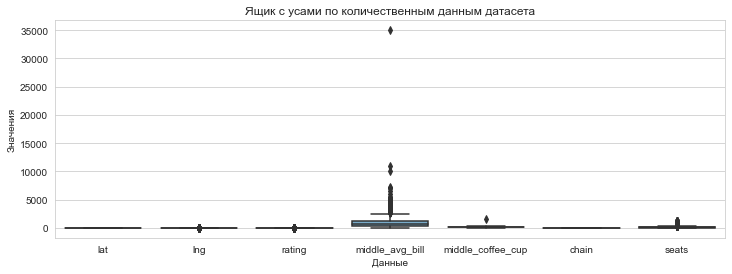

In [14]:
plt.figure(figsize=(12, 4))
# применяем стиль whitegrid из библиотеки seaborn
sns.set_style('whitegrid')
sns.boxplot(data=data, palette='Blues_r')  #ящик с усами
plt.title('Ящик с усами по количественным данным датасета')
plt.xlabel('Данные')
plt.ylabel('Значения')
plt.show()

В столбце `middle_avg_bill` есть большое количество экстремальных значений, одно из них равняется 35 000 рублей.

In [15]:
data['middle_avg_bill'].describe() #значения столбца

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

Так как в этом столбце производные данные из столбца `avg_bill`, посмотрим, каков средний счет у этого заведения.

In [16]:
data[data['middle_avg_bill'] == 35000] 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.65745,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0


Этим заведением является ресторан "Кафе" со средним счетом 20 000 - 50 000 рублей, прайс - высокий. Скорее всего, это не является аномалией. Такие рестораны могут работать, например, только на банкеты - поэтому средний чек такой высокий.

### Добавление столбцов

Необходимо добавить столбец с названием улицы и столбец с обозначением, круглосуточное ли заведение.

In [17]:
data['street'] = data['address'].str.split(', ').str[1] #разделяем

In [18]:
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно') #добавляем столбец

In [19]:
data[data['hours']=='ежедневно, круглосуточно'].head(3) 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
10,great room bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,Левобережная улица,True
17,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
19,пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд,True


Столбцы добавлены корректно.

## Анализ данных

* Проанализировать данные
    + Изучить категории заведений, визуализировать
    + Исследовать кол-во посадочных мест, визуализировать
    + Исследовать сетевые и несетевые заведения
    + Составить топ-15 популярных сетей
    + Изучить заведения в разрезе по районам
    + Визуализировать распределение рейтингов
    + Построить хороплет
    + Отобразить все заведения с помощью кластеров
    + Составить топ-15 улиц по кол-ву заведений, визуализировать
    + Построить хороплет по среднему чеку района

### Категории заведений

Исследовать заведения по категориям: кофейни, рестораны, пиццерии, бары и т.д. Визуализировать распределение заведений по категориям.

Посмотрим, какие есть категории заведений в датасете. Затем посчитаем количество по категориям.

In [20]:
data['category'].unique() 

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

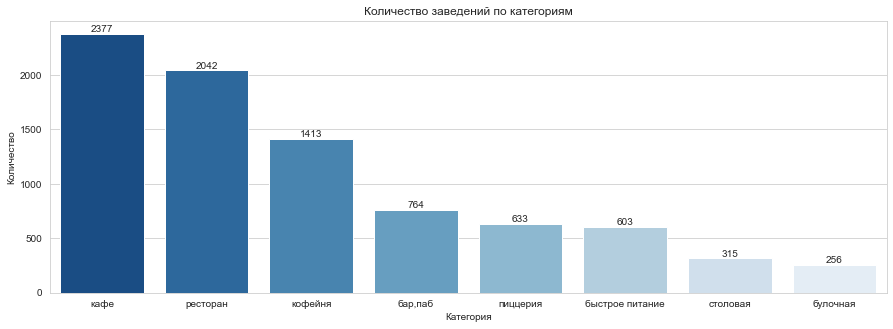

In [21]:
#!pip install 
count_values = data.value_counts('category').sort_values(ascending=False).reset_index() #создаем таблицу

# применяем стиль whitegrid из библиотеки seaborn
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# строим линейный график средствами seaborn
ax=sns.barplot(data=count_values, x='category', y=0, palette='Blues_r')
ax.bar_label(ax.containers[0])
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество')
# отображаем график на экране
plt.show()

Больше всего заведений в категории "кафе" - это средние заведения, куда можно сходить и с семьей, и с друзьями, и одному. Они, как правило, дешевле ресторанов, но немного солиднее, чем быстрое питание.

Меньше всего заведений в категориях "столовая" и "булочная". Как правило, горожане пользуются столовыми во время обеденного перерыва, но теперь гораздо реже - ведь в кафе и ресторанах атмосфера приятнее и есть бизнес-ланчи. А булочных в датасете так мало, скорее всего, потому что заведения работают обычно как продуктовые магазины, и в таблицу с общественным питанием попали только те, где организована возможность поесть прямо в булочной.

### Посадочные места

Визуализировать кол-во посадочных мест по категориям.

In [22]:
data.groupby('category')['seats'].sum().sort_values(ascending=False).reset_index() #создаем таблицу

,category,seats
0,ресторан,154681.0
1,кафе,118494.0
2,кофейня,83511.0
3,"бар,паб",58131.0
4,пиццерия,40350.0
5,быстрое питание,34513.0
6,столовая,16359.0
7,булочная,13229.0


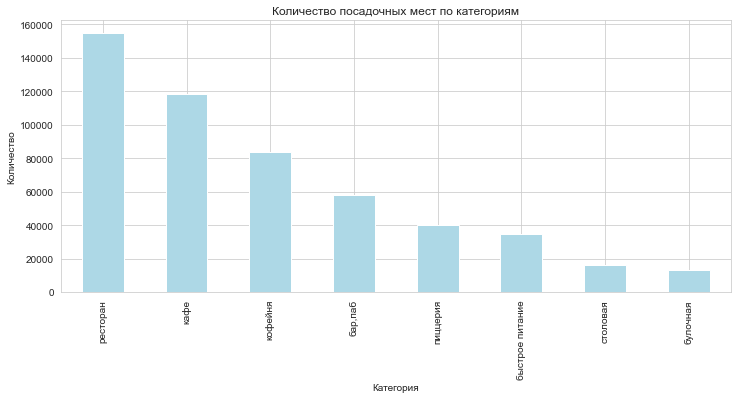

In [23]:
plt.figure(figsize=(12, 5))
data.groupby('category')['seats'].sum().sort_values(ascending=False).plot(kind='bar', color = 'lightblue')
plt.title('Количество посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.show()

Больше всего посадочных мест в категории "рестораны" - 154 869 мест. На втором месте "кафе" - 118 494 мест. Хоть кафе в Москве больше, но посадочных мест в сумме меньше, чем в ресторанах.

Как и в распределении по количеству заведений, на последних местах оказались столовые и булочные. Столовых становится все меньше и меньше, а в булочных делают покупки, а не едят.

### Сетевые и несетевые заведения

Рассмотрим распределение по количеству заведений сетевых и несетевых заведений.

In [24]:
chain = data.groupby('chain')['name'].count().to_frame() #новая таблица

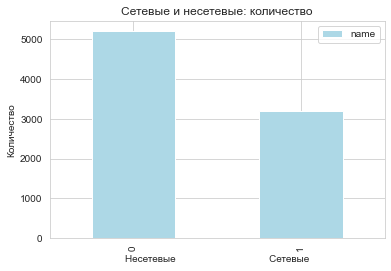

In [25]:
chain.plot(kind='bar', color='lightblue')
plt.title('Сетевые и несетевые: количество')
plt.xlabel('Несетевые                                  Сетевые')
plt.ylabel('Количество')
plt.show()

**Несетевые заведения:** 5 200 <br>
**Сетевые заведения:** 3 302

Больше несетевых заведений - это неудивительно, владельцы часто открывают по одному заведению и не топорятся делать филиалы.

Посмотрим распределение сетевых и несетевых категорий по категориям.

In [26]:
chain_categ = data.groupby(['category', 'chain'], as_index=False)[['name']].count().sort_values(by='name', ascending = False)
chain_categ

,category,chain,name
6,кафе,0,1598
12,ресторан,0,1313
7,кафе,1,779
13,ресторан,1,729
9,кофейня,1,720
8,кофейня,0,693
0,"бар,паб",0,596
4,быстрое питание,0,371
11,пиццерия,1,330
10,пиццерия,0,303


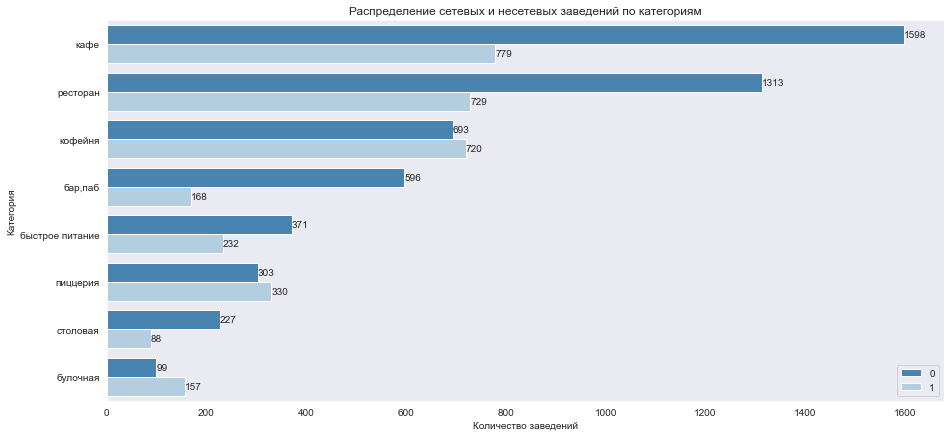

In [27]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(15, 7))
# строим столбчатый график средствами seaborn
ax=sns.barplot(x='name', y='category', data=chain_categ, hue='chain', palette='Blues_r')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение сетевых и несетевых заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.grid = True
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# отображаем график на экране
plt.show()

Больше всего несетевых заведений в категориях "кафе" и "рестораны". Меньше всего в "столовые" и "булочные". <br>
Больше всего сетевых заведений в категориях "кафе" и "рестораны". Меньше всего в "бар, паб" и "столовые".

### Топ-15 популярных сетей

Составим топ-15 сетей в Москве по количеству заведений сети. 


Переименуем заведение "кулинарная лавка братьев караваевых" на "К. л. б. Караваевых" для удобства визуализации

In [28]:
data['name'] = data['name'].str.replace('кулинарная лавка братьев караваевых', 'к. л. б. караваевых') #меняем

In [29]:
# Собираем отдельно топ-15 заведений и их категории: 
chain_top_15 = data[data['chain'] == 1]
chain_top_15 = chain_top_15.groupby(['name', 'category']).agg({'name' : 'count'})
chain_top_15.columns = ['count']
chain_top_15 = chain_top_15.sort_values('count', ascending = False).reset_index().head(15)
chain_top_15.head(15)

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,к. л. б. караваевых,кафе,39
9,теремок,ресторан,36


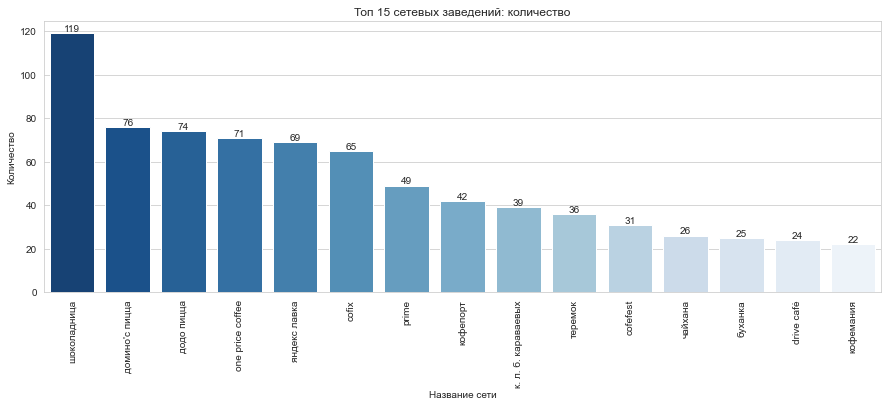

In [30]:
# применяем стиль whitegrid из библиотеки seaborn
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(15, 5))
# строим линейный график средствами seaborn
ax=sns.barplot(x='name', y='count', data=chain_top_15, palette='Blues_r')
ax.bar_label(ax.containers[0])
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Топ 15 сетевых заведений: количество')
plt.xlabel('Название сети')
plt.ylabel('Количество')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# отображаем график на экране
plt.show()

На первом месте - Шоколадница. Далее идут пиццерии Домино'с пицца и Додо пицца. Замыкает топ Кофемания. Эти сетевые заведения популярны не только в Москве, их названия часто бывают на слуху.

Посмотрим, какие категории входят в топ-15 популярных сетей.

In [31]:
list_top15_name = chain_top_15['name'].unique()
top15_df = data.query('chain == 1').query('name in @list_top15_name')
top15_df.groupby(['name', 'category']).agg(count_object=('name', 'count'))
top15_category =  (top15_df.groupby('category', as_index=False)
                              .agg(count_object=('name', 'count')))
top15_category['ratio'] = top15_category['count_object'] / top15_category['count_object'].sum()
top15_category = top15_category.sort_values(by='ratio', ascending=False)
top15_category

,category,count_object,ratio
3,кофейня,356,0.449495
5,ресторан,164,0.207071
4,пиццерия,150,0.189394
2,кафе,93,0.117424
0,булочная,25,0.031566
1,быстрое питание,4,0.005051


In [32]:
fig = go.Figure(data=[go.Pie(labels=top15_category['category'], # указываем значения, которые появятся на метках сегментов
                             values=top15_category['ratio'], # указываем данные, которые отобразятся на графике
                             pull = [0.07, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Распределение категорий в топ-15 сетевых заведений', # указываем заголовок графика
                  width=700, # указываем размеры графика
                  height=500,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории',
                                    showarrow=False)])
fig.show() # выводим график

Самыми популярными стали кофейни, далее рестораны и пиццерии. В последнее время стали набирать популярность кофейни из разряда "кофе с собой", а также кофейни используют как коворкинги, поэтому можно объяснить, что кофейни лидируют в топе.

### Административные районы

Построим распределение по количеству заведений и количеству заведений каждой категории по районам. 

In [33]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [34]:
district_count = data.groupby('district')['name'].agg('count').sort_values(ascending=False).reset_index()

fig = px.bar(district_count,
            y='name',
            x='district', text_auto=True)
fig.update_layout(title='Количество заведений в округе',
        yaxis_title='Количество',
        xaxis_title='Округ')

fig.show()

Наибольшее количество заведений расположено в Центральном округе, это неудивительно - в центре выгодно располагать заведения, так как трафик там самый высокий. Выгодны будут как рестораны, так и кофейни, фастфуды и столовые.

Меньше всего заведений в Северо-западном округе, всего 409.

In [35]:
district_category = data.pivot_table(index='district', columns='category', values='name', aggfunc='count')
district_category['всего'] = district_category['бар,паб']+district_category['булочная']+district_category['быстрое питание']+district_category['кафе']+district_category['кофейня']+district_category['пиццерия']+district_category['ресторан']+district_category['столовая']
district_category=district_category.sort_values(by='всего', ascending=True)
district_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
district,,,,,,,,,
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,238,150,71,218,24,850
Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
Южный административный округ,68,25,85,264,131,73,202,44,892
Северный административный округ,68,39,58,235,193,77,188,41,899
Центральный административный округ,364,50,87,464,428,113,670,66,2242


In [36]:
fig = px.bar(district_category,
            x=district_category.index,
            y=district_category.columns[district_category.columns != "всего"], text_auto=True,
            width=1000, height=750)
fig.update_layout(
        yaxis_title='Район',
        xaxis_title='%',
        legend_title = 'Категории заведений')
fig.show()

В центральном округе больше ресторанов, затем идут кафе и кофейни. В остальных округах больше категории "кафе", как в и распределениях выше. Также лидируют рестораны и кофейни.

### Средние рейтинги по категориям

Построим распределение по категориям средних рейтингов заведений. Для этого необходимо собрать таблицу, где для каждой категории будет отображен средний рейтинг заведений.

Средний рейтинг заведений в Москве:

In [37]:
print('Средний рейтинг заведений', round(data['rating'].mean(), 2))

Средний рейтинг заведений 4.23


In [38]:
category_rating = data.groupby('category')['rating'].agg('mean').sort_values(ascending=False).reset_index()
category_rating['rating'] = round(category_rating['rating'], 2)

In [39]:
fig = px.bar(category_rating,
            y='rating',
            x='category', text_auto=True)
fig.update_layout(title='Средний рейтинг категории',
        yaxis_title='Рейтинг',
        xaxis_title='Категория')
fig.show()

По рейтингу лидируют бары/пабы, их средняя оценка 4,39. Хуже всего оценивают фастфуды - 4,05. Рейтинги различаются не сильно. В целом заведения Москвы не оценивают ниже 4 - это очень хороший уровень.

### Хороплет

Построим хороплет со средним рейтингом каждого района. Границы районов Москвы хранятся в файле `admin_level_geomap.geojson`. Небоходимо создать таблицу с районом и рейтингом.

In [40]:
district_rating = data.groupby('district', as_index=False)['rating'].agg('mean')
district_rating.sort_values('rating')

,district,rating
6,Юго-Восточный административный округ,4.101120
3,Северо-Восточный административный округ,4.147978
7,Юго-Западный административный округ,4.172920
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
8,Южный административный округ,4.184417
4,Северо-Западный административный округ,4.208802
2,Северный административный округ,4.239822
5,Центральный административный округ,4.377520


In [41]:
# загружаем JSON-файл с границами округов Москвы
with open(r'admin_level_geomap.geojson', 'r', encoding='utf8') as f:
    try: geo_json=json.load(f)
    except: geo_json = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

На карте хорошо видно распределение рейтинга заведений по районам. При удалении от центра рейтинги падают.

### Отображение кластеров

Отобразим на карте все заведения с помощью кластеров.

In [42]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

Построим график распределения кол-ва заведений и их категорий по улицам, предварительно отобрав топ-15.

In [43]:
top_street = (data.pivot_table(index='street', values='name', aggfunc='count')
             .sort_values(by='name', ascending=False)[:15])
top_street

,name
street,
проспект Мира,183
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


In [44]:
fig = px.bar(top_street,
            x='name',
            y=top_street.index, text_auto=True)
fig.update_layout(title='Количество заведений на улице: топ 15',
        yaxis_title='Количество заведений',
        xaxis_title='Улица')
fig.show()

In [45]:
df_top_street = (data.query('street in @top_street.index')
                .pivot_table(index='street', columns='category', values='name', aggfunc='count')
                .sort_values(by='ресторан', ascending=False))

df_top_street = df_top_street.fillna(0)
df_top_street['total'] = df_top_street.sum(axis=1)
df_top_street=df_top_street.sort_values(by='total', ascending=False).reset_index()
df_top_street = df_top_street.drop(columns='total')
df_top_street

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,проспект Мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
1,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
2,проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
3,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
4,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
6,Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
7,Варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0
8,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
9,МКАД,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0


In [46]:
fig = px.bar(df_top_street, x=df_top_street['street'], y=df_top_street.columns,
            title='Количество заведений и их категории в районе', text_auto=True)
fig.update_layout(title='Распределение топ-15 улиц по кол-ву заведений',
                 yaxis_title='Кол-во заведений',
                 xaxis_title='Районы',
                 plot_bgcolor='white')
fig.update_yaxes(gridcolor='grey')
fig.show()


Большинство заведений на самой популярной улице проспект Мира - кафе (53), рестораны (45), кофейни (36).

### Улицы с одним заведением

In [47]:
cafe_on_street = data['street'].value_counts().sort_values().reset_index()
street_with_one_cafe = cafe_on_street[cafe_on_street['street']==1]

Насчитывается 458 улиц, где указано всего 1 заведение. Выберем эти улицы в глобальном датасете и визуализируем на карте эти заведения. Может быть, они расположены в окраинах.

In [48]:
onecafestreets_name = street_with_one_cafe['index'].unique()
full_inf_one_cafe_on_street = data.query('street in @onecafestreets_name')

In [49]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
full_inf_one_cafe_on_street.apply(create_marker, axis=1)
# df[:5].apply(create_marker, axis=1) # к первым пяти записям
    
# выводим карту
m

Гипотеза не подвтердилась, заведения расположены как в центре, так и на окраинах. Скорее всего это связано с тем, что эти улицы, переулки и тупики небольшие/короткие, поэтому там есть всего 1 заведение. Также, возможно, что информация о заведениях просто еще не появилась в Яндекс.Бизнесе и Яндекс.Картах.

### Средние чеки по районам

Необходимо рассчитать медиану среднего чека `middle_avg_bill` по каждому району и визуализировать это на карте.

Средний чек по Москве:

In [50]:
data['middle_avg_bill'].mean()

958.0536678310575

Медианный чек:

In [51]:
data['middle_avg_bill'].median()

750.0

In [52]:
district_middle_bill = data.groupby('district')['middle_avg_bill'].agg('median').reset_index()
district_middle_bill.sort_values('middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [53]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=district_middle_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Наибольший медианный средний чек в Центральном и Западном округах, при удалении от центра средний чек уменьшается.

**Промежуточный вывод:** 
Самыми многочисленными заведениям в Москве являются кафе, рестораны и кофейни. Менее всего - столовых и булочных. Посадочных мест больше всего в категории "рестораны", менее всего в "булочных". Это можно объяснить тем, что в булочных покупают товар на вынос, а не едят на месте. 

Несетевых заведений 5 200, сетевых 3 302. Больше несетевых заведений - это неудивительно, владельцы часто открывают по одному заведению и не торопятся делать филиалы. Больше всего несетевых заведений в категориях "кафе" и "рестораны". Сетевых больше также в этих категориях. По количеству сетевых филиалов на 1 месте Шоколадница, далее Домино'с пицца и Додо пицца. 

Большинство заведений в Москве расположены в Центральном округе, в остальных округах их на порядок меньше (в 2 и более раз). В Северо-Западном округе всего 409 заведений. В центральном округе больше всего ресторанов, кафе и кофеен. 

Средний рейтинг всех заведений в Москве 4,23. Наиболее высоко оценивают бары/пабы (оценка 4,39). На последнем месте фастфуды (4,05).

Большинство заведений расположено на проспекте Мира (183), далее идут Профсоюзная улица и проспект Вернадского. Популярные категории - кафе и рестораны. 
Также в датасете присутствуют улицы с 1 заведением, их всего 458. Скорее всего, это небольшие/короткие улицы, переулки и переходы, а также есть вероятность, что информацию о соседних заведениях еще не появилась на Яндекс.Бизнесе.

Средний чек по Москве 958 рублей. Медиана - 750. Самый высокий средний чек в Центральном и Западном округах (1000). Самый маленький в Юго-Восточном - 450 рублей. При удалении от центра средний чек уменьшается.

## Открытие кофейни

Необходимо детализировать исследование для открытия кофейни в Москве. 

Ответить на следующие вопросы:
1. Количество кофеен в датасете, районы распределения, особенности расположения.
2. Время работы кофеен, круглосуточность.
3. Рейтинг кофеен. Распределение рейтингов по районам.
4. Стоимость чашки капучино.

### Количество кофеен, районы, особенности

In [54]:
print('Всего кофеен:', data[data['category']=='кофейня']['name'].count())
print('Уникальных названий кофеен:', data[data['category']=='кофейня']['name'].nunique())

Всего кофеен: 1413
Уникальных названий кофеен: 825


В датасете всего 1413 кофеен. Это 16,8% от всех заведений. Из них 825 уникальных названий кофеен. То есть кофейни представлены как сетевые, так и несетевые.

Отделим датасет `data` в отдельный датасет только с кофейнями `coffeehouses`. Далее рассмотрим распределение кофеен по районам.

In [55]:
coffeehouses = data[data['category']=='кофейня']
district_cof_name = coffeehouses.groupby('district')['name'].count().sort_values(ascending=False).reset_index()
district_cof_name

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


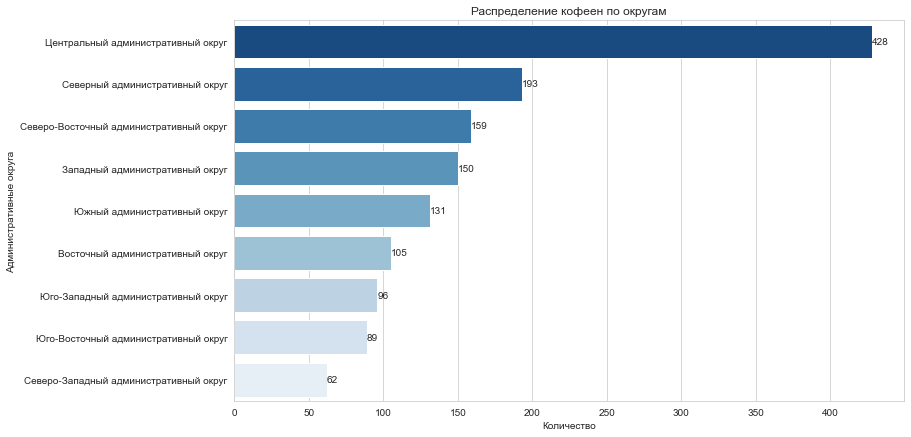

In [56]:
plt.figure(figsize=(12, 7))
sns.set_style('whitegrid')
ax=sns.barplot(y='district', x='name', data = district_cof_name, palette = 'Blues_r')
ax.set_title('Распределение кофеен по округам')
ax.set_ylabel('Административные округа')
ax.set_xlabel('Количество')
ax.bar_label(ax.containers[0])
plt.grid=True

In [57]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffeehouses.apply(create_clusters, axis=1)

# выводим карту
m

Кофейни расположены 
* по туристическим тропам: в центре города по главным улицам и достопримечательностям, по самым популярным улицам, например, Арбат и Тверская
* возле тогровых центров и внутри них, многие люди используют кофейни как коворкинги и места для встреч
* возле бизнес-центров, горожане берут кофе с собой перед работой
* на окраинах расположены вдоль главных улиц района

### Часы работы кофейни

In [58]:
coffeehouses.value_counts('hours').head(10).reset_index()

,hours,0
0,"ежедневно, 10:00–22:00",140
1,"ежедневно, 08:00–22:00",60
2,"ежедневно, круглосуточно",59
3,"ежедневно, 09:00–22:00",57
4,пн-пт 08:00–19:00,46
5,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",46
6,"ежедневно, 09:00–21:00",43
7,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",42
8,"ежедневно, 08:00–21:00",36
9,пн-пт 08:00–18:30,34


140 кофеен работают ежедневно с 10 до 22 часов. 60 кофеен работают с 8 утра до 22 часов. И всего 59 кофеен в Москве работают круглосуточно. 

В основном кофейни работают с 8-9 утра до 21-22 часов вечера. Такие часы работы объясняются тем, что многие люди пьют кофе по утрам, перед работой, и заходят в кофейни на завтрак.

### Рейтинг кофеен

Посмотрим на средний рейтинг кофеен, распределение по районам.

In [59]:
print('Средний рейтинг кофеен:', round(coffeehouses['rating'].mean(),2))

Средний рейтинг кофеен: 4.28


In [60]:
district_cof_rating = coffeehouses.groupby('district')['rating'].mean().sort_values(ascending=False).reset_index()
district_cof_rating

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


In [61]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=district_cof_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Лучше всего оценивают кофейни в Центральном округе и Северо-Западном. В целом кофейни в Москве оценивают не ниже 4.2

### Стоимость чашки капучино

Узнаем, на какую стоимость чашки капучино нужно ориентироваться.

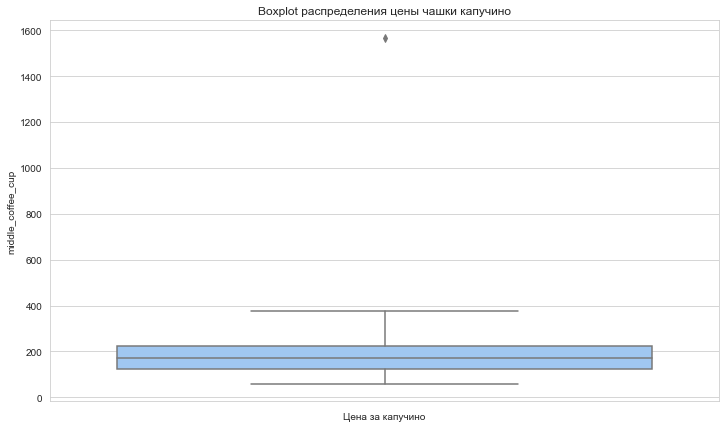

In [62]:
plt.figure(figsize=(12, 7))
ax = sns.boxplot(y='middle_coffee_cup', data=coffeehouses)
ax.set_title('Boxplot распределения цены чашки капучино') 
ax.set_xlabel('Цена за капучино')
plt.show()

На графике видна одна аномалия, посмотрим ее подробнее.

In [63]:
coffeehouses[coffeehouses['middle_coffee_cup']>1500]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,Большая Семёновская улица,False


Шоколадница - сетевая кофейня. Скорее всего, цены одинаковые во всех заведениях. Посмотрим все Шоколадницы в Москве. Скорее всего в данных есть ошибка, в столбце `avg_bill` должны быть значения "230-290Р".

In [64]:
coffeehouses[coffeehouses['name']=="шоколадница"]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
151,шоколадница,кофейня,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.910447,37.542227,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN,Дмитровское шоссе,False
240,шоколадница,кофейня,"Москва, Широкая улица, 13А",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.887990,37.662485,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,75.0,Широкая улица,False
343,шоколадница,кофейня,"Москва, Фестивальная улица, 13, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.855703,37.477670,4.3,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,100.0,Фестивальная улица,False
360,шоколадница,кофейня,"Москва, Сходненская улица, 25",Северо-Западный административный округ,"ежедневно, 08:00–23:00",55.846066,37.438897,4.3,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,130.0,Сходненская улица,False
381,шоколадница,кофейня,"Москва, Сходненская улица, 56",Северо-Западный административный округ,"ежедневно, 10:00–22:00",55.850700,37.443523,4.3,NaN,NaN,NaN,NaN,1,140.0,Сходненская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7651,шоколадница,кофейня,"Москва, Кировоградская улица, 14",Южный административный округ,"ежедневно, 10:00–22:00",55.622498,37.606618,4.3,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,48.0,Кировоградская улица,False
7670,шоколадница,кофейня,"Москва, Профсоюзная улица, 129А",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.619023,37.506517,4.1,NaN,NaN,NaN,NaN,1,180.0,Профсоюзная улица,False
7677,шоколадница,кофейня,"Москва, Варшавское шоссе, 140",Южный административный округ,"ежедневно, 10:00–22:00",55.611830,37.608381,4.2,NaN,NaN,NaN,NaN,1,NaN,Варшавское шоссе,False
7897,шоколадница,кофейня,"Москва, Ореховый бульвар, 14к3",Южный административный округ,"ежедневно, 10:00–22:00",55.609682,37.720095,4.2,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN,Ореховый бульвар,False


Как и ожидалось, цены в Шоколаднице на чашку кофе не более 280 рублей. Принято решение удалить из датасета Шоколадницу с аномалией.

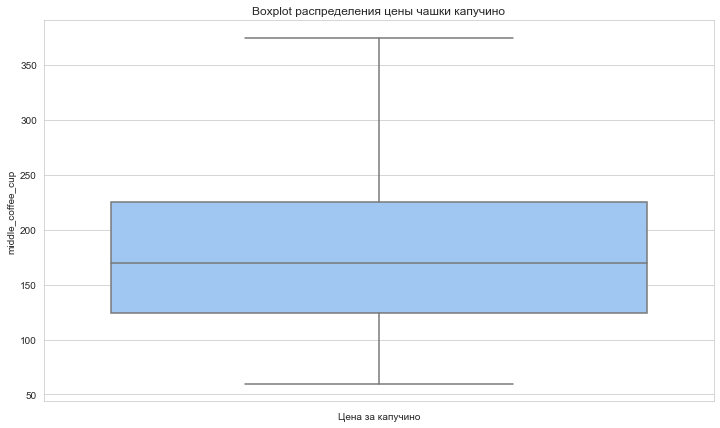

In [65]:
coffeehouses = coffeehouses[coffeehouses['middle_coffee_cup']<1500]
plt.figure(figsize=(12, 7))
ax = sns.boxplot(y='middle_coffee_cup', data=coffeehouses)
ax.set_title('Boxplot распределения цены чашки капучино') 
ax.set_xlabel('Цена за капучино')
plt.show()

In [66]:
coffeehouses['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

In [67]:
print('Средняя цена капучино: ', round(coffeehouses['middle_coffee_cup'].mean(),2))
print('Медианная цена капучино: ', round(coffeehouses['middle_coffee_cup'].median(),2))

Средняя цена капучино:  172.38
Медианная цена капучино:  169.5


Средняя цена капучино по районам:

In [68]:
mean_cup_district = coffeehouses.groupby('district')['middle_coffee_cup'].mean().sort_values(ascending=False).reset_index()
mean_cup_district

,district,middle_coffee_cup
0,Западный административный округ,189.938776
1,Центральный административный округ,187.518519
2,Юго-Западный административный округ,184.176471
3,Северный административный округ,165.789474
4,Северо-Западный административный округ,165.523810
5,Северо-Восточный административный округ,165.333333
6,Южный административный округ,158.488372
7,Юго-Восточный административный округ,151.088235
8,Восточный административный округ,140.024390


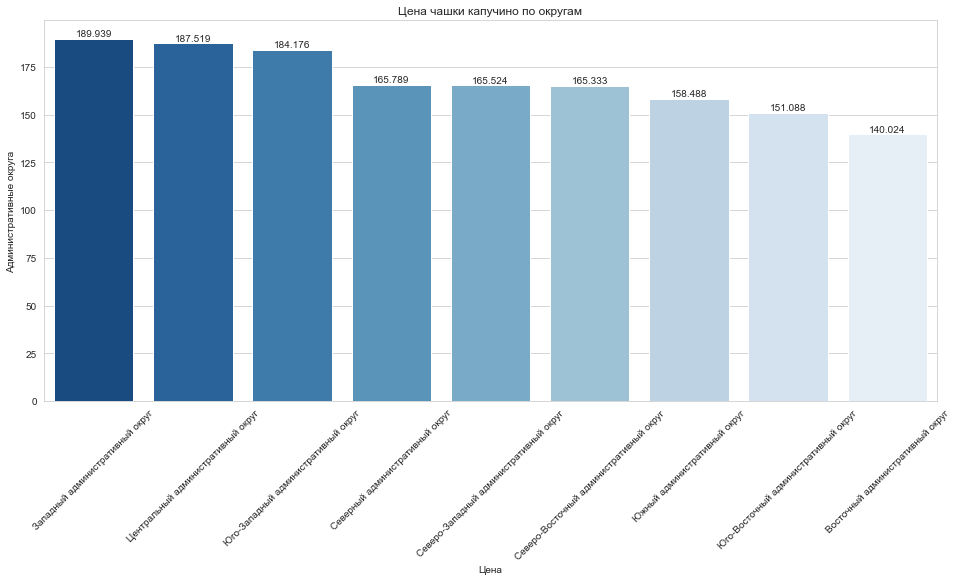

In [69]:
plt.figure(figsize=(16, 7))
sns.set_style('whitegrid')
ax=sns.barplot(x='district', y='middle_coffee_cup', data = mean_cup_district, palette = 'Blues_r')
ax.set_title('Цена чашки капучино по округам')
ax.set_ylabel('Административные округа')
ax.set_xlabel('Цена')
ax.bar_label(ax.containers[0])
plt.grid=True
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# отображаем график на экране
plt.show()

В целом по Москве средняя цена чашки капучино равна 172 рублей. Дороже всего в Западном округе и Центральном. Дешевле в Восточном округе.

### Зависимости цены капучино от параметров

Изучим также:
* Зависимость сетевого или несетевого заведения и стоимости капучино
* Зависимость цены капучино и посадочных мест
* Зависимость цены капучино и рейтинга
* Зависимость цены капучино и круглосуточности работы

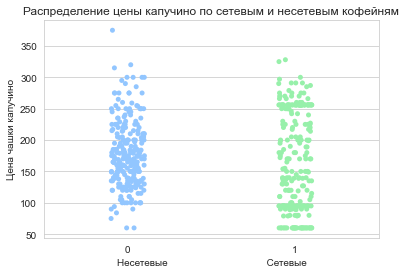

In [70]:
sns.stripplot(x='chain', y='middle_coffee_cup', data=coffeehouses)
plt.title('Распределение цены капучино по сетевым и несетевым кофейням')
plt.xlabel('Несетевые                                    Сетевые')
plt.ylabel('Цена чашки капучино')
# отображаем график на экране
plt.show()

Явной зависимости, что в сетевых или несетевых кофейнях дороже нет.

Проверим корреляцию между посадочными местами и ценой капучино.

In [71]:
print('Коэффициент корреляции: ', round(coffeehouses['seats'].corr(coffeehouses['middle_coffee_cup']),2))

Коэффициент корреляции:  -0.02


Кол-во посадочных мест не коррелирует с ценой за капучино.

Посмотрим на зависимость цены капучино и рейтинга.

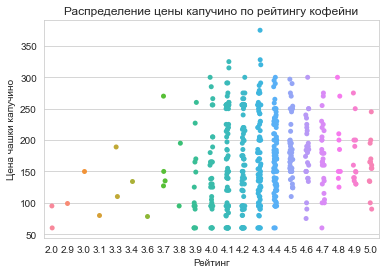

In [72]:
sns.stripplot(x='rating', y='middle_coffee_cup', data=coffeehouses)
plt.title('Распределение цены капучино по рейтингу кофейни')
plt.xlabel('Рейтинг')
plt.ylabel('Цена чашки капучино')
# отображаем график на экране
plt.show()

In [73]:
print('Коэффициент корреляции: ', round(coffeehouses['rating'].corr(coffeehouses['middle_coffee_cup']),2))

Коэффициент корреляции:  0.15


На графике видно, что нет зависимости между ценой капучино и рейтингом кофейни. Также это показывает коэффициент корреляции.

Посмотрим, как распределяются цены в зависимости от круглосуточности работы.

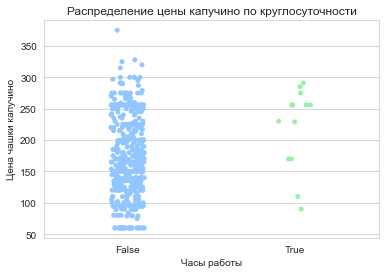

In [74]:
sns.stripplot(x='is_24_7', y='middle_coffee_cup', data=coffeehouses)
plt.title('Распределение цены капучино по круглосуточности')
plt.xlabel('Часы работы')
plt.ylabel('Цена чашки капучино')
# отображаем график на экране
plt.show()

Круглосуточные кофейни выбирают цены немного выше, чем некруглосуточные.

**Рекомендации по открытию кофейни:**

Для более точных рекомендаций необходимо имет информацию о трафике районов и посещаемости кофеен.

Исследование показало, что в Москве всего 1413 кофеен, это 16,8 от всех заведений. Большинство кофеен расположено в Центральном округе, также их достаточно много в Северном и Северо-Восточном округах. 

Соответственно, рекомендуется открывать кофейни в округах, где конкуренция меньше: например, в Северо-Западном, Юго-Западном или Юго-Восточном. Располагать кофейню рекомендуется вблизи популярных туристических улиц или главных улиц района/микрорайона, недалеко от транспортных узлов. Также возможен вариант расположения возле парков.

Самое популярное время работы кофеен - ежедневно с 10 до 22 часов. В целом, кофейни открывают с 8 до 22 часов. 

В Центральном и Северо-Западном округах оценивают кофейни выше, но не намного. В целом оценка не ниже 4.2

Стоимость чашки капучино распределена от 169 до 225 рублей. Максимальная стоимость = 375, минимальная = 60. Рекомендуется назначить цену в зависимости от района расположения. Например, в Восточном не выше 140 рублей, в Юго-Западном не выше 184Р, в Юго-Восточном не выше 151Р.

## Презентация


https://disk.yandex.ru/i/UjWlJ93K45pkTg